In [1]:
%run lgs03a_data_unification.ipynb

In [20]:
epistatic_pairs_pos = {gene : 
                     doublemuts[doublemuts.gene==gene+'GFP'].groupby('position_pseudo').apply(
                                                                             lambda x: list(x['epistasis']))
                     for gene in ['amac', 'amacV14L', 'cgre', 'pplu', 'av']}
epistatic_pairs_pos = {gene : dict(epistatic_pairs_pos[gene]) for gene in epistatic_pairs_pos}

In [62]:
%run lgs_figures_functions.ipynb

<Figure size 432x288 with 0 Axes>

In [29]:
import warnings
warnings.filterwarnings(action='ignore')

In [13]:
genes = ['amac','av','cgre','pplu']

In [4]:
import cmocean
from matplotlib.colors import ListedColormap
# c = matplotlib.cm.GnBu
# c = sns.cm.crest_r
c = cmocean.cm.rain_r
# c = plt.get_cmap('mako')
# c = ListedColormap(cmocean.color_palette('algae', 256))

# colors = {'amacV14L':c(0), 'V14L':c(0),'amacV14LGFP':c(0),'amacGFP:V14L':c(0), 
#           'amac':c(50), 'amacGFP':c(50), 
#           'cgre':c(125), 'cgreGFP':c(125),
#            'pplu':c(200),  'ppluGFP':c(200),'ppluGFP2':c(200),
#           'av':c(240), 'avGFP':c(240), }

colors = {'amacV14L':c(0), 'V14L':c(0),'amacV14LGFP':c(0),'amacGFP:V14L':c(0), 
          'amac':c(50), 'amacGFP':c(50), 
          'cgre':c(110), 'cgreGFP':c(110),
           'pplu':c(170),  'ppluGFP':c(170),'ppluGFP2':c(170),
          'av':c(220), 'avGFP':c(220), }

## Fig. 1

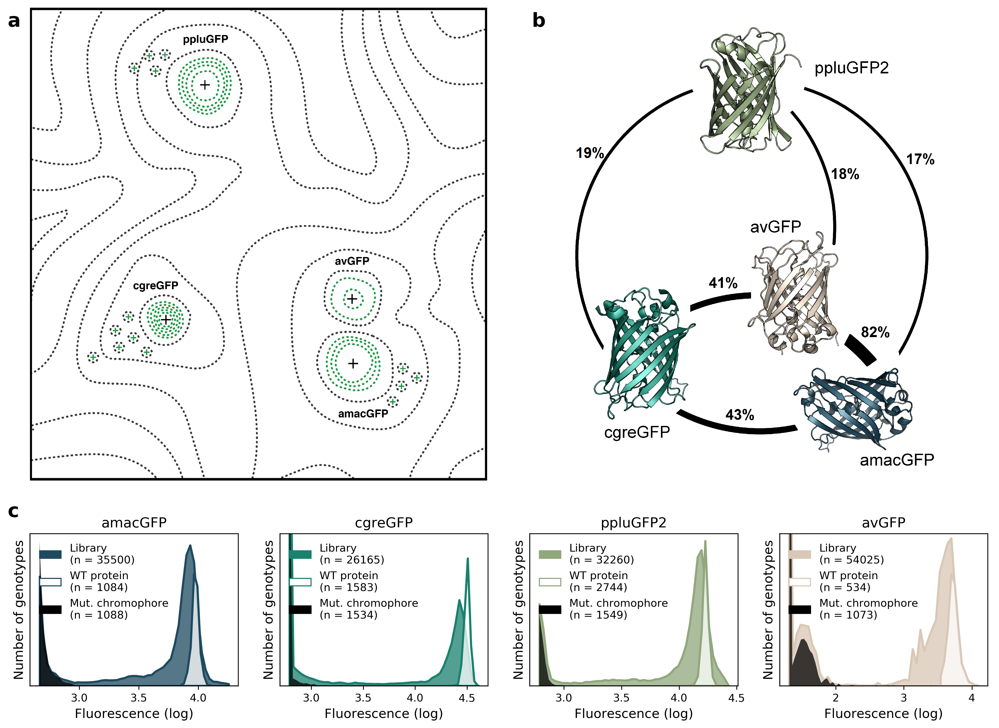

In [94]:
plt.figure(figsize=[16,12], dpi=300)

plt.subplot(4,4,(1,10))
show_image(os.path.join(figures_folder, 'other_images', 'katya_fig1_v2.png'))

plt.subplot(4,4,(3,12))
show_image(os.path.join(figures_folder, 'other_images', 'structures_identity_gfps2.png'))


for i,g in zip([13,14,15,16], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(4,4,i)
    plot_library_distributions(g, data_nt, data_aa, ax)   
    plt.ylabel('Number of genotypes', fontsize=12)
    
    if i==13:
        plt.text(2.4, 19500, 'a', fontsize=18, weight='semibold')
        plt.text(6.8, 19500, 'b', fontsize=18, weight='semibold')
        plt.text(2.4, 5000, 'c', fontsize=18, weight='semibold')
    
# plt.tight_layout()

# plt.savefig(os.path.join(figures_folder,'eLife_final_figs', 'elife_fig1.png'), dpi=300)

**A**, Side by side comparison of the sharpness of different GFP fitness peaks, showing the median relative brightness of genotypes at different mutational steps away from the wild-type. **B**, Distribution of fluorescence of genotypes with a single amino acid substitution in exposed versus buried sites, compared to the wild-type distribution of genotypes with only synonymous nucleotide mutations. **C**, Fraction of genotypes observed to display above-zero fluorescence in our data, out of all those expected to be fluorescent if all mutation effects were additive.

## Figure 2

In [7]:
singlemuts_landscapes = pd.read_csv('single_mutant_landscapes.csv', index_col=0)

In [8]:
for n in [1,2,3,4,5,6,7]:
    singlemuts_landscapes[str(n)] = singlemuts_landscapes[[str(n), f'n_obs:{n}']].apply(lambda x:
                                                    x[0] if x[1] > 15 else np.nan, axis=1)

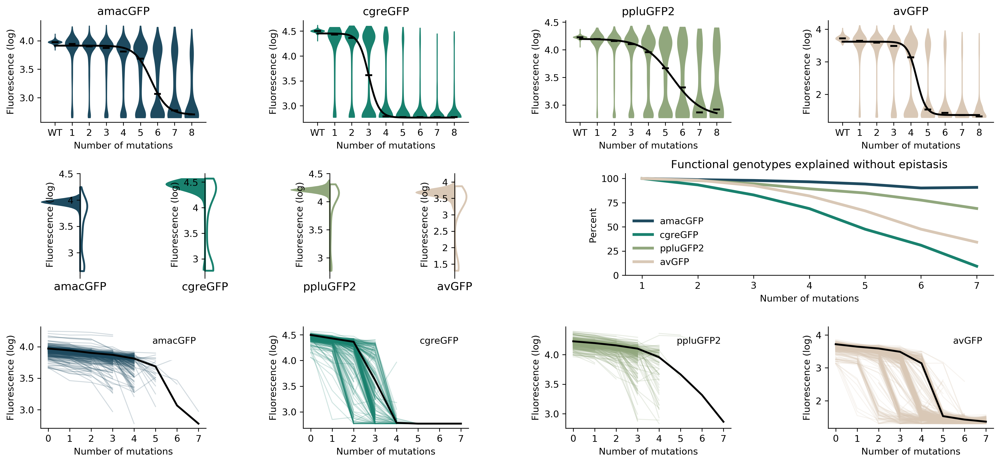

In [93]:
plt.figure(figsize=[15,7], dpi=300)
# plt.axis('off')

for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(3,4,i)
    get_fitnesses_by_nmut(gene, 9, data_nt, data_aa , fit=True)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.title(names[gene])
#     ax.spines['bottom'].set_visible(False)
    
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(3,4,i+8)
    meds = [data_aa[(data_aa.gene==gene) & (data_aa.n_mut==i)]['brightness'].median() for i in range(8)]
    for i in singlemuts_landscapes[singlemuts_landscapes.gene==gene].index:
        plt.plot(range(8), singlemuts_landscapes[singlemuts_landscapes.gene==gene].loc[i][0:8], 
             linewidth =1, color=colors[gene], alpha=0.2)
    plt.plot(range(8), meds, color='k', linewidth=2)
    plt.xticks(range(8),range(8))
    legendary(['w'], [''], title=names[gene], loc='upper right', fontsize=12)
    plt.ylabel('Fluorescence (log)', fontsize=10)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
#     ax.spines['bottom'].set_visible(False)
    plt.xlabel('Number of mutations', fontsize=10)
#     plt.yticks([2,3,4], [2.0,3.0,4.0])
    
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    plt.subplot(3,8,i+8)
    plot_buried_vs_exposed_violins_singles(gene)
    plt.ylabel('Fluorescence (log)', fontsize=10)
    
ax = plt.subplot(3,2,4)
plot_predicted_bright_vs_real(data_aa, False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
label_plot_axis(x = 'Number of mutations', t='Functional genotypes explained without epistasis', 
                y='Percent', fontsize_t=12, fontsize_x=10, fontsize_y=10)
    
plt.tight_layout(pad=1)

# plt.savefig('figure_2_NEW.png', dpi=300)

## Fig. 3

In [16]:
def get_overall_epistasis_overlap(gene1, gene2, e):
    # get mutation pairs which are measured to be epistatic in one gene
    # and measured as non-epistatic in another gene
    
    epairs1 = {x for x in epistatic_pairs_pos[gene1] if
                                abs(max(epistatic_pairs_pos[gene1][x]))>e
                            and x in epistatic_pairs_pos[gene2]}
    
    epairs2 = {x for x in epistatic_pairs_pos[gene2] if
                                abs(max(epistatic_pairs_pos[gene2][x]))>e
                            and x in epistatic_pairs_pos[gene1]}
#     assert len(epairs1) == len(epairs2)
    
    eboth = [x for x in epairs1 if x in epairs2]
    esingle = list(epairs1) + [x for x in epairs2 if x not in epairs1]
#     esingle = [x for x in epairs1 if x not in epairs2] + [x for x in epairs2 if x not in epairs1]
    
    return [len(eboth) / len(esingle), len(esingle)]

In [22]:
def plot_bars_effectchange_epimaintain_split(ax1, ax2, spread = 1.4, c=matplotlib.cm.bone(225)):
    mako = ListedColormap(sns.color_palette('bone', 256))

    shares = {}
    fractions = {}
    pairs = [('amac','amacV14L'), ('amac','av'),('amacV14L','av'),
                 ('amac','cgre'), ('amacV14L', 'cgre'), ('av','cgre'),
             ('amac','pplu'), ('amacV14L','pplu'), ('av','pplu'), ('cgre','pplu')]

    
#     names = {'amac' : 'Amac', 'cgre' : 'Cgre', 'pplu':'Pplu', 'av':'Av', 'amacV14L':'Amac:V12L'}
    
    for pair in pairs:
        fractions[pair] = get_overall_fractions_cross_gene_effects(pair[0],pair[1],2,5)
        shares[pair] = get_overall_epistasis_overlap(pair[0], pair[1], e=0.3)

    # TOP PLOT
    x = np.array([0, 2,3, 5,6,7, 9,10,11,12])
    plt.sca(ax1)
    plt.bar(x*spread, [100*fractions[pair]['bn'] for pair in pairs], width=0.8, color=c, edgecolor='k')
    plt.ylabel('Neutrality change\n(% of mutations)', fontsize=11)
    
    plt.xticks(x*spread, 
               [f'n = {fractions[pair]["n_muts"]}' for pair in pairs], 
               rotation=0, ha='center' ,  fontsize=10, va = 'top')#va='center_baseline')
    
    for i in range(len(pairs)):
        plt.text(x = x[i]*spread, y = 1+ 100*fractions[pairs[i]]['bn'], #s = fractions[pairs[i]]['n_muts'],
                 s = f'{names[pairs[i][1]]},\n{names[pairs[i][0]]}', fontsize=9,
                rotation = 0, ha='center', va='bottom')
    plt.ylim(0,21)
    
    for xi in np.array([1,4,8])*spread:
        plt.axvline(xi, linewidth=1, linestyle = ':', color='k')

    for xi,div in zip(np.array([0,2.5,6,10.5])*spread, 
                        ['0.4% divergence', '18% divergence', '57-59% divergence', '81-83% divergence']):
        plt.text(xi, 23, div, horizontalalignment='center', verticalalignment='center', fontsize=12)  
    
    
    
    # BOTTOM PLOT
    plt.sca(ax2)
    plt.bar(x*spread, [100*shares[pair][0] for pair in pairs], width=0.8, color=c, edgecolor='k')
    plt.ylabel('Pairs of sites epistatic\nin both genes (%)', fontsize=11)
    plt.xticks(x*spread, ['']*len(x), rotation=0, ha='right' , fontsize=8, va='center_baseline')
    plt.ylim(0,9)
    
    for i in range(len(pairs)):
        plt.text(x = x[i]*spread, y = 0.5+ 100*shares[pairs[i]][0], #s = fractions[pairs[i]]['n_muts'],
                 s = f'{names[pairs[i][1]]},\n{names[pairs[i][0]]}', fontsize=9,
                rotation = 0, ha='center', va='bottom')
    plt.xticks(x*spread, 
               [f'n = {shares[pair][1]}' for pair in pairs], 
               rotation=0, ha='center' ,  fontsize=10, va = 'top')#va='center_baseline')
        
    for xi in np.array([1,4,8])*spread:
        plt.axvline(xi, linewidth=1, linestyle = ':', color='k')
        
    
#     plt.xlabel('Percent')


C:\Users\lgonzale\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  This is separate from the ipykernel package so we can avoid doing imports until


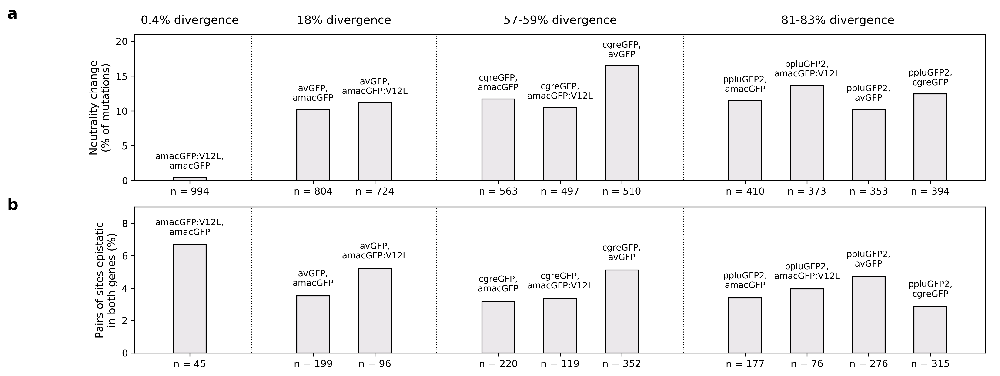

In [24]:
fig = plt.figure(figsize=[15,6], dpi=300)
make_figure_letters(fig, {'a':(-0.15,1.05), 'b':(-0.15,0.45)}, fontsize=16)

ax1,ax2 = fig.add_subplot(2,1,1), fig.add_subplot(2,1,2)
plot_bars_effectchange_epimaintain_split(ax1,ax2, 1.5, c=cmocean.cm.rain_r(250))
plt.tight_layout()
plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_fig3.png'), dpi=300)

In [341]:
def check_all_neutral(genotype, gene, threshold):
    if genotype=='wt':
        return True
    muts = genotype.split(':')
    neutrals = [m for m in muts if m in eval('siffects_' + gene[0: -3] + '_log') and
                 eval('siffects_' + gene[0: -3] + '_log')[m] > threshold]
    if len(neutrals) == len(muts):
        return True
    else:
        return False

data_aa['contains_only_neutrals'] = data_aa[['aa_genotype_pseudo', 'gene']].apply(lambda x:
                                                    check_all_neutral(x[0], x[1], -0.043), axis=1)

In [313]:
5/17

0.29411764705882354

In [348]:
len(data_aa[cgre_mask & (data_aa.n_mut==6) 
        & (data_aa.contains_only_neutrals==True)
#         & (data_aa.expected_effect > ((ref_wt_log['cgreGFP']- 3*0.028) - ref_wt_log['cgreGFP']))
       & (data_aa.measured_effect > (gate_borders_log['cgre'][0] - ref_wt_log['cgreGFP']))
       ])

9

In [336]:
np.exp(np.log(10 ** (4.5)))

31622.77660168378

In [340]:
np.log10(np.exp(np.log(10 ** (4.5)) - 0.1)) - 4.5

-0.04342944819032546

## Figure 4: Results of neural net predictions

In [14]:
predictions = load_predictions_data()

{'amacGFP': 2.652246341003323, 'cgreGFP': 2.7708520116421442, 'ppluGFP': 2.7708520116421442, 'avGFP': 1.283419239}


In [66]:
stds = {'amac':0.031, 'cgre':0.028, 'pplu':0.027}

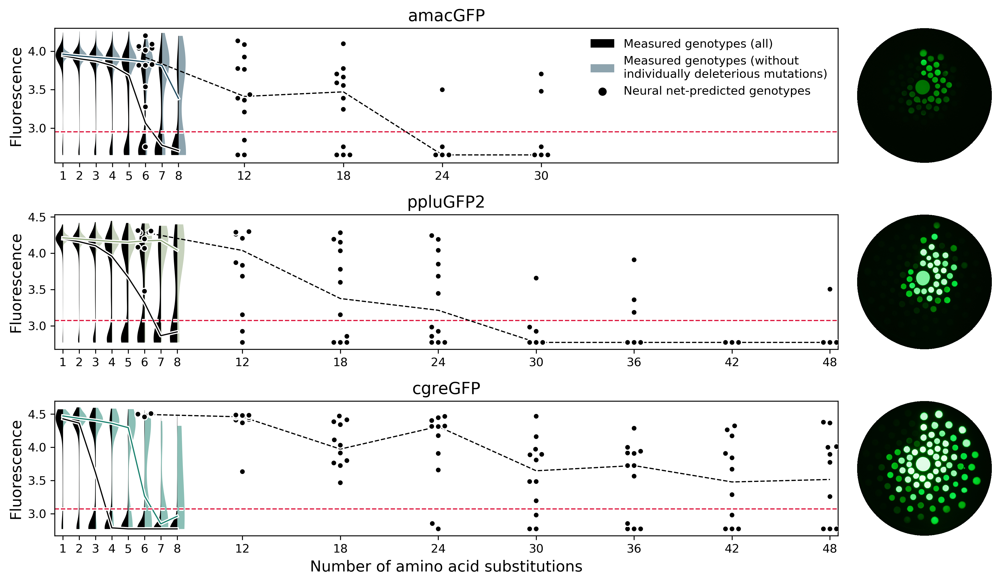

In [78]:
fig = plt.figure(figsize=[12,7], dpi=300)

# make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.65), 'c':(-0.05, 0.30)}, fontsize=20)
mako = cmocean.cm.rain_r
vcolor = [[mako(250), mako(250)],[mako(0), mako(0)], ]

ax1 = fig.add_subplot(3,6,(1,5))
mako = ListedColormap(sns.color_palette('bone', 256))
plot_predictions('amac',mode='full', threshold = stds['amac']*3,
                 color=[[colors['amac'],colors['amac']],['k','k'],], )

plt.hist([-10], color='k', label='Measured genotypes (all)')
plt.hist([-10], bottom=3, color=colors['amac'], alpha=0.5, 
         label='Measured genotypes (without\nindividually deleterious mutations)')
plt.scatter([-1],[3],color='k', label = 'Neural net-predicted genotypes', zorder=10)
plt.legend(frameon=False, loc='upper right')

# legendary(colors=['k', colors['amac'], 'k'], loc='upper right', fontsize=10, edges=['k','k','k'],
#                   labels=['Measured genotypes (all)', 
#                           'Measured genotypes (without\nindividually deleterious mutations)', 
#                           'Neural net-predicted genotypes'], ncol=1, )
label_plot_axis(y='Fluorescence', t='amacGFP', fontsize_t=14)
plt.xticks(list(range(8))+[11,17,23,29], list(range(1,9))+[12,18,24,30])
plt.ylim(2.55, 4.3)

ax6 = fig.add_subplot(3,6,6)
show_image(os.path.join(figures_folder, 'other_images', 'prediction_blobs_amac.png'))

ax2 = fig.add_subplot(3,6,(7,11))
plot_predictions('pplu',mode='full',threshold = stds['pplu']*3,
                 color=[[colors['pplu'],'w'],['k','k'],], )
label_plot_axis( y='Fluorescence', t='ppluGFP2', fontsize_t=14)

ax3 = fig.add_subplot(3,6,12)
show_image(os.path.join(figures_folder, 'other_images','prediction_blobs_pplu.png'))

ax4 = fig.add_subplot(3,6,(13,17))
plot_predictions('cgre',mode='full',threshold = stds['cgre']*3,
                 color=[[colors['cgre'],'w'],['k','k'],], )
# plt.yticks([0,0.5,1],[0.0,0.5,1.0])
label_plot_axis(x='Number of amino acid substitutions', y='Fluorescence', t='cgreGFP', fontsize_t=14)

ax5 = fig.add_subplot(3,6,18)
show_image(os.path.join(figures_folder,'other_images', 'prediction_blobs_cgre.png'))

plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'eLife_final_figs','elife_fig5.png'), dpi=300)

## Suppl. Fig. 2: Library sorting

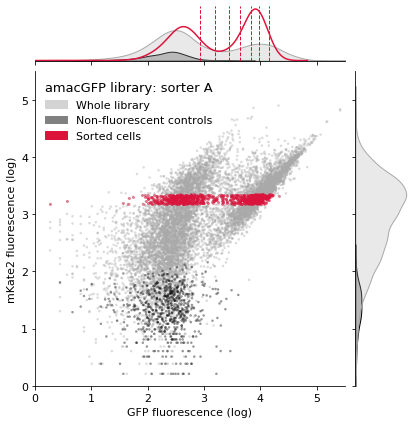

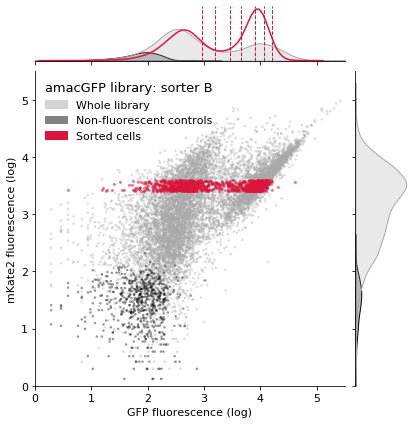

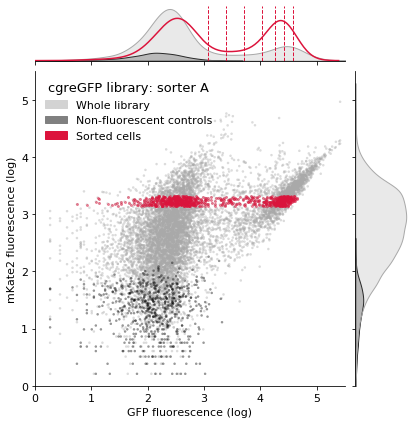

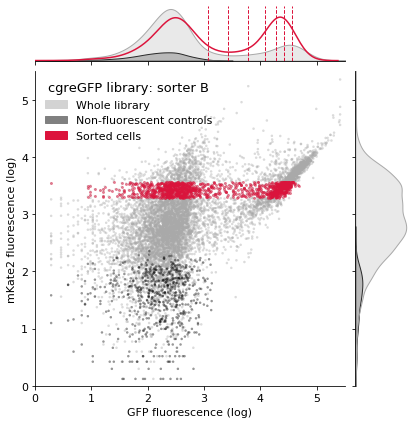

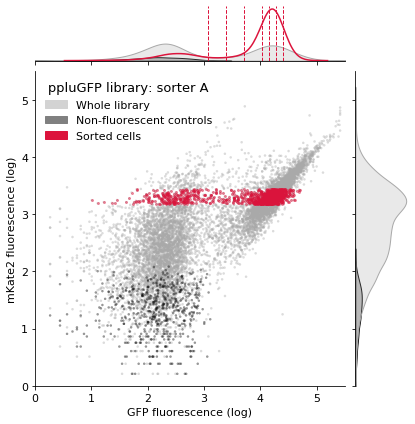

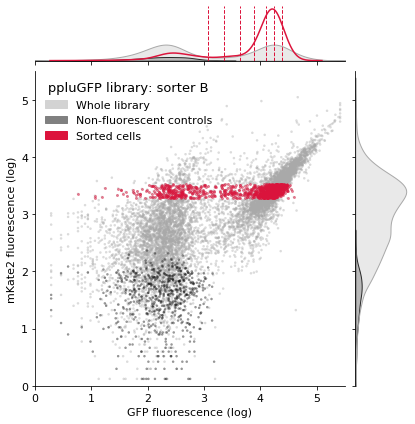

In [29]:
for gene in ['amac', 'cgre', 'pplu']:
    for machine in ['A', 'B']:
        sortingplot_library_scatter(gene, machine)
#         plt.savefig(os.path.join(figures_folder, gene+machine+'_sortingscatter.png'), format='png', dpi=500)

## Suppl. Fig. 9: Extant vs non-extant mutations

In [172]:
def plot_extant_vs_nonextant_muts(gene, dataset=data_aa, y_axis = 'brightness', n=7):
    df = dataset[(dataset.gene==gene+'GFP') & (dataset.n_mut<n)]
    df['f_extant'] = df[['n_mut', 'n_mut_extant']].apply(lambda x:
                                            'all' if x[0]==x[1] else 'none' if x[1]==0 else 'some', axis=1)
    
    sns.violinplot(data = df[(df.f_extant=='all')|(df.f_extant=='none')],
                  x = 'n_mut', y = y_axis, hue = 'f_extant', split=True, cut=0, inner=None, linewidth=2)
    
    patch_violinplot([colors[gene], 'w']*(n-1) , [colors[gene],colors[gene]]*(n-1))
    legendary([],[],)

In [276]:
def plot_extant_vs_nonextant_muts(gene, dataset=data_aa, y_axis='brightness', palette='mako', n=5):
    c = ListedColormap(sns.color_palette(palette, 256))
    df = dataset[dataset.gene==gene+'GFP']
    df['f_extant'] = df[['n_mut', 'n_mut_extant']].apply(lambda x:
                                            'all' if x[0]==x[1] else 'none' if x[1]==0 else 'some', axis=1)
    
    plot_half_violin([df[(df['n_mut']==i) & (df['f_extant']=='none')][y_axis] for i in range(1,n)], 
                     side='left', 
                     color=[colors[gene],colors[gene]], alpha=1, widths=0.8, chonkylines=True)

    plot_half_violin([df[(df['n_mut']==i) & (df['f_extant']=='all')][y_axis] for i in range(1,n)], 
                     side='right', alpha=1, linestyle='--', linewidth=1,
                     color=['w',colors[gene]], widths=0.9, chonkylines=True)
#     plt.ylim(df[y_axis].min() - 0.25, df[y_axis].max() + 0.1)

    label_plot_axis(x = 'Number of mutations', t= gene+'GFP')
    plt.xticks(range(n-1), range(1,1+n))

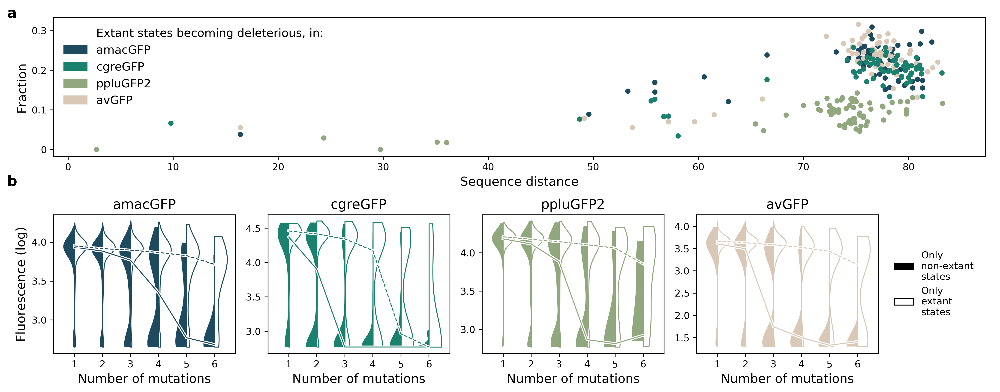

In [278]:
fig = plt.figure(figsize=[15,6], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)
cmap = matplotlib.cm.bone
j=9

ax1 = fig.add_subplot(2,j,(1,j))
for gene in ['amac','av','cgre','pplu']:
    compare_against_extant(gene, nok=-0.15, overlap_n=1, s=20, marker='o')
legendary(['w']+[colors[gene] for gene in ['amac','cgre','pplu','av']], 
          ['Extant states becoming deleterious, in:','amacGFP','cgreGFP','ppluGFP2','avGFP'],
         fontsize=12, )
plt.yticks([0,0.1,0.2,0.3],[0,0.1,0.2,0.3])
label_plot_axis(x='Sequence distance', y='Fraction')

i = j+1
for gene in ['amac','cgre','pplu','av',]:
    ax = fig.add_subplot(2,j,(i,i+1))
    plot_extant_vs_nonextant_muts(gene, n=7, )
    plt.title(names[gene], fontsize=14)
    if  i==j+1:
        plt.ylabel('Fluorescence (log)')
    i += 2
#     ax.get_legend().remove()
    
ax = fig.add_subplot(2,j,j*2)
legendary(['k','w'], ['Only\nnon-extant \nstates', 'Only\nextant\nstates'], ['k','k'], loc='center right')
plt.axis('off')
    
plt.tight_layout()

# plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_suppl_fig13.png'), dpi=300)

## Suppl. Fig. 3: Mutation effects by position

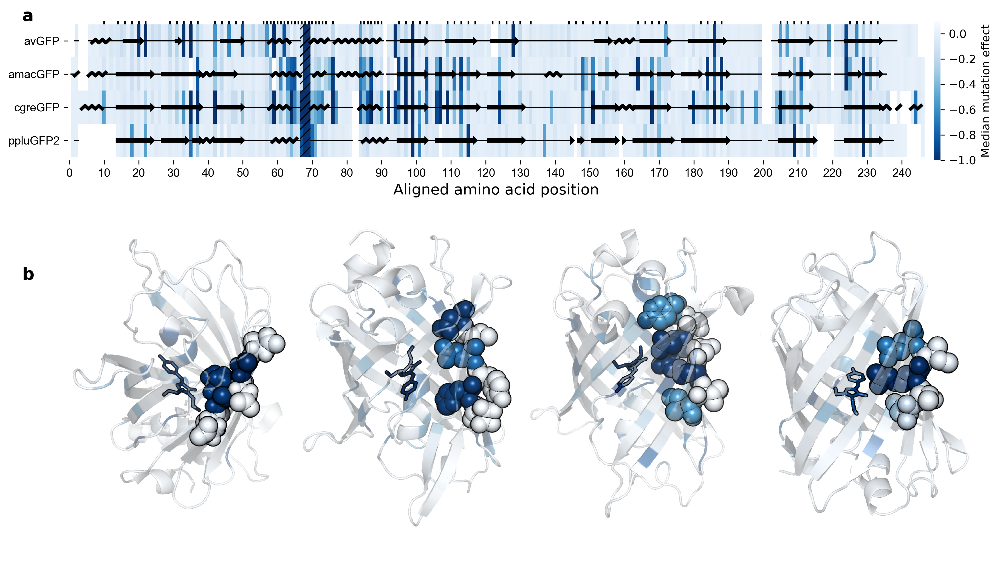

In [322]:
fig = plt.figure(figsize=[13,7], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)


ax1 = fig.add_subplot(3,1,1)
plot_positional_effects_heatmap(df=df_effects_singles_scaled, cm = 'Blues_r')
plt.title('')

ax2 = fig.add_subplot(3,1,(2,3))
show_image(os.path.join(figures_folder, 'other_images', 'allGFPs_scaled_effectsByPos2.png'))
    
plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'eLife_final_figs','suppl_fig4.png'), dpi=300)

**A**, Median effects of single mutations according to sequence position. Positions constituting the chromophore are hatched, and internally-oriented sites are labeled with tick marks. Protein secondary structure, as extracted from the respective crystal structures, is overlaid. **B,C,D,E**, Median effects of single mutations visualized on protein 3D structures, respectively avGFP (2WUR), amacGFP, cgreGFP (2HPW), and ppluGFP2 (2G3O).

In [226]:
gate_borders_log

{'amac': array([2.95303446, 3.19617619, 3.45720041, 3.64811596, 3.86814462,
        4.02255208, 4.18198642]),
 'cgre': array([3.07151381, 3.41396997, 3.74865309, 4.05623766, 4.27143499,
        4.4214147 , 4.56988282]),
 'pplu': array([3.07151381, 3.37812525, 3.67407999, 3.9626534 , 4.12316537,
        4.26158401, 4.39274091])}

## Suppl. Fig. 4: Pairwise epistasis, general

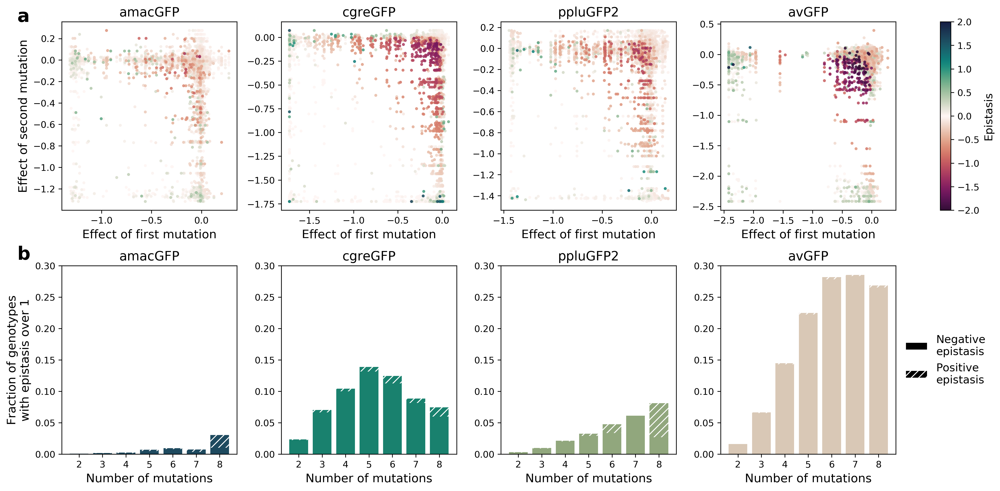

In [252]:
fig = plt.figure(figsize=[16,8], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.45)}, fontsize=20)


j = 17
for i,gene in zip(range(1,j*2,4), ['amac', 'cgre', 'pplu', 'av']):
    ax1 = fig.add_subplot(2,j,(i, i+3))
    doublemut_scatterplot(gene, cm = cmocean.cm.curl_r) 
    plt.title(names[gene], fontsize=14)
    
    if i>1:
        plt.ylabel('')
    ax2 = fig.add_subplot(2,j,(i+j,i+j+3))
    barplot_epistasis(gene, e=1)
    plt.title(names[gene], fontsize=14)
    if i>1:
        plt.ylabel('')
    plt.ylim(0, 0.3)
        

ax3 = fig.add_subplot(2,j,j)
norm = matplotlib.colors.Normalize(vmin=-2, vmax=2)
cb1 = matplotlib.colorbar.ColorbarBase(ax3, cmap=cmocean.cm.curl_r,norm=norm,orientation='vertical')
cb1.ax.tick_params(labelsize=10)
cb1.set_label('Epistasis',color='k',size=12)
        
ax4 = fig.add_subplot(2,j,j*2)
plt.legend([mpatches.Patch(facecolor='k', edgecolor='w'),
    mpatches.Patch(facecolor='k', hatch='///', edgecolor='w')], ['Negative\nepistasis', 'Positive\nepistasis'],
          frameon=False, loc='center', fontsize=12)
plt.axis('off')

plt.tight_layout()     

plt.savefig(os.path.join(figures_folder, 'eLife_final_figs','elife_suppl_fig5.png'), dpi=300)

**A**, Epistasis in genotypes with two mutations, highlighting negative epistatic interactions between individually neutral or slightly deleterious mutations. **B**, Fraction of genotypes with increasing numbers of mutations which display strong epistasis.

## Suppl. Fig. 6: Distances between amino acid pairs

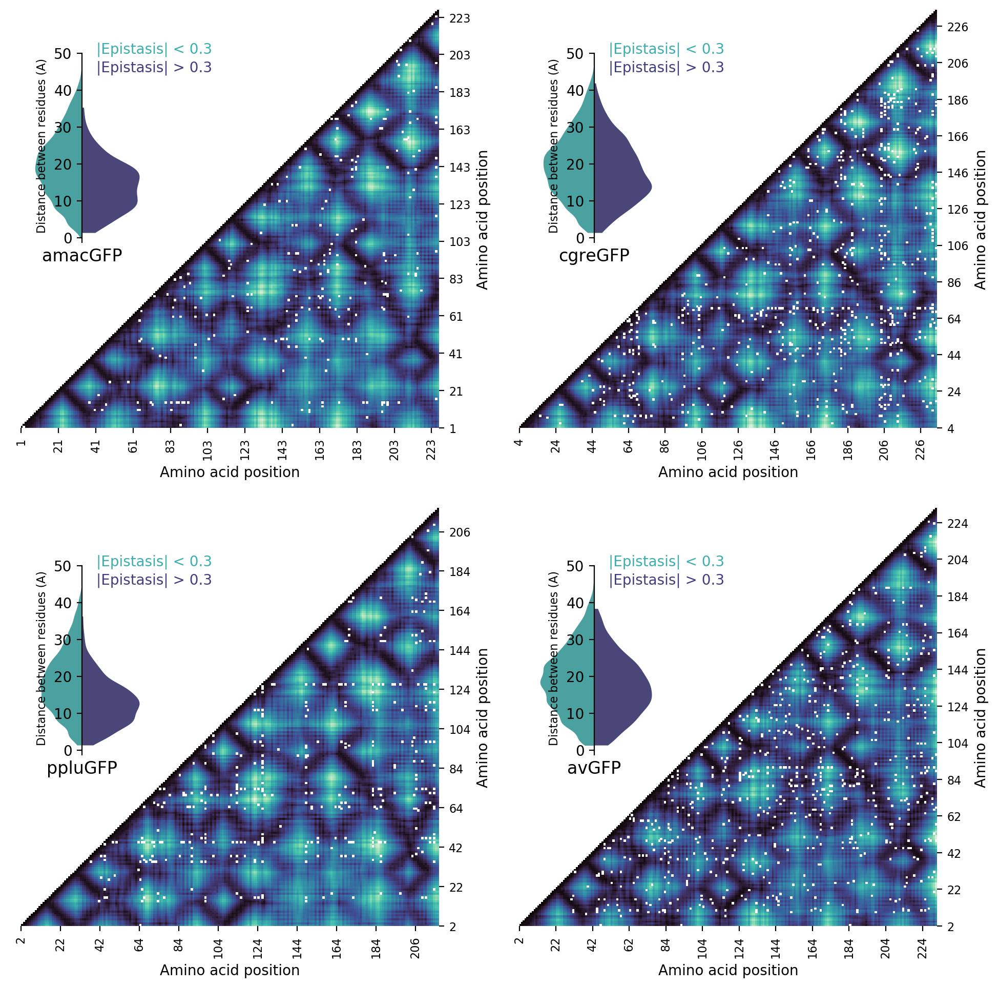

In [335]:
plot_all_distance_maps(c = sns.cm.mako)
# plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'suppl_fig7.png'), dpi=300)

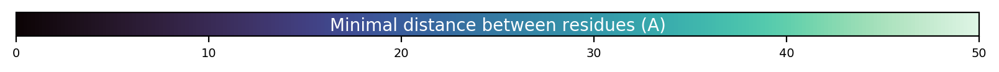

In [91]:
mako = ListedColormap(sns.color_palette('mako', 256))
fig,ax = plt.subplots(figsize=[10,0.5], dpi=200)
fig.subplots_adjust(bottom=0.5)

norm = matplotlib.colors.Normalize(vmin=0, vmax=50)
cb1 = matplotlib.colorbar.ColorbarBase(ax, cmap=mako,norm=norm,orientation='horizontal')
cb1.ax.tick_params(labelsize=7)
cb1.set_label('Minimal distance between residues (A)',labelpad=-25, color='w',)
plt.savefig(os.path.join(figures_folder, 'suppl_fig7_colorbar.png'),dpi=300)

Relationship of physical distance between two residues and their observed epistasis. Heatmaps show, for each gene, the minimal distance in Angstroms between two positions, with pairs of sites showing epistatic interactions over 0.3 shown in white. Inset violin plots show the distribution of distances between non-epistatic and epistatic pairs; in all cases, epistatic pairs tend to be physically closer (Mann Whitney U, p < 10^-13)

## Suppl. Fig. 5: Protein stability

In [279]:
spectra_abs, spectra_fluo = import_plate_reader_data()

**A,B**, Absorbance (grey) and fluorescence (green) spectra of purified protein in 9M urea (A) or 1X PBS (B), at room temperature, measured every 30 minutes for 60 hours; darker lines correspond to later timepoints. Plotted values are the means of eight technical replicates. **C**, Maximum absorbance across time in 9M urea and 1X PBS. **D**, Maximum fluorescence across time in 9M urea and 1X PBS. **E**, Fluorescence of purified protein at increasing temperatures; melting temperatures indicated by dashed vertical lines, where possible. Gene color codes are shared between **C,D,E**, and shaded areas indicate standard deviation of eight technical replicas.

In [280]:
from scipy.optimize import curve_fit

def plot_urea_fluo_loss():

    spectra_fluo['time_h'] = spectra_fluo['t'].apply(lambda x : x*(25/60))

#     plt.figure(figsize=[20,3], dpi=300)

    for gene in ['pplu','av','amacV14L','amac','cgre',]:

        xdata = spectra_fluo[(spectra_fluo.gene==gene) & (spectra_fluo.treatment=='urea') &
                             (spectra_fluo.peak==True) ]['time_h']
        ydata = spectra_fluo[(spectra_fluo.gene==gene) & (spectra_fluo.treatment=='urea') &
                             (spectra_fluo.peak==True) ]['signal_normalized']

        plt.scatter(xdata,ydata,
                   color=colors[gene], label=gene, s=1, alpha=0.5)
        ax = sns.lineplot(data = spectra_fluo[(spectra_fluo.treatment=='urea') & (spectra_fluo.peak==True)
                                             & (spectra_fluo.gene==gene)], 
                     x = 'time_h', y = 'signal_normalized', ci=None, color=colors[gene])
        ax.get_legend().remove()

        if gene=='av':
            def curvy(x,a1,k1):
                return a1 * np.exp(-k1 * x)
        elif gene=='pplu' or gene=='cgre':
            def curvy(x,a0,a1,k1):
                return a0 + a1 * np.exp(-k1 * x)
        elif gene=='amac' or gene=='amacV14L':
            def curvy(x,a0,a1,k1,a2,k2):
                return a0 + a1 * np.exp(-k1 * x) + a2 * np.exp(-k2 * x) 
        elif gene=='cgre':
            def curvy(x,a0,a1,k1,a2,k2, c2):
                return a0 + a1 * np.exp(-k1 * x) + a2 * np.exp(-k2 * (x-c2)**2) 

        if gene !='cgre':
            popt, pcov = curve_fit(curvy,  xdata,  ydata, maxfev=100000)

            x = np.linspace(0, 57, 1000)
            y = curvy(x, *popt)
            plt.plot(x,y, color='k', linewidth =1 )

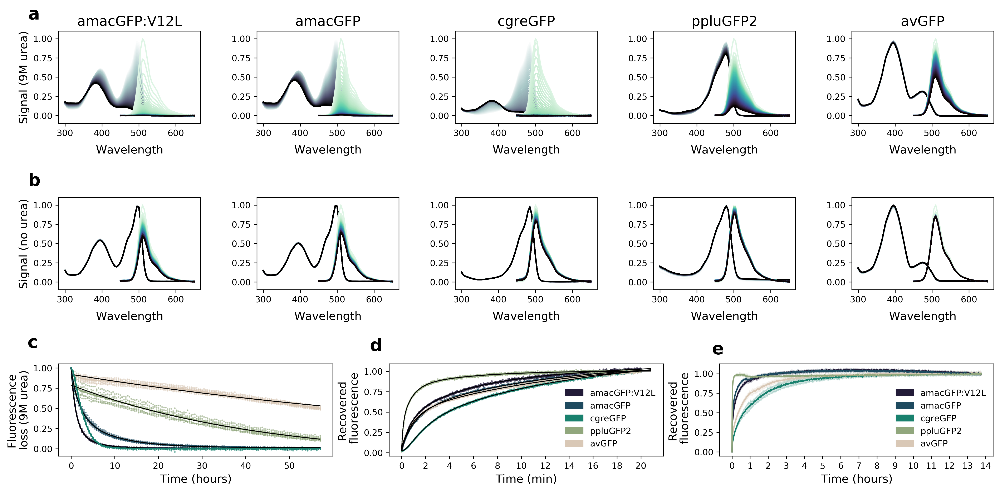

In [283]:
plt.figure(figsize=[16, 8], dpi=300)

for i,gene in zip(range(1,15,3),['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(3,15,(i,i+2))
    plot_spectra(gene=gene, treatment='urea')
    label_plot_axis(t=names[gene],)
    plt.xlabel('Wavelength', labelpad=8)
    if i==1:
        plt.ylabel('Signal (9M urea)')
        plt.text(200, 1.25, 'a', fontsize=20, weight='semibold')
        
    ax2 = plt.subplot(3,15,(i+15, i+15+2))
    plot_spectra(gene=gene, treatment='pbs')
    plt.xlabel('Wavelength', labelpad=8)
#     ax2.xaxis.tick_top()
    if i==1:
        plt.ylabel('Signal (no urea)')    
        plt.text(200, 1.25, 'b', fontsize=20, weight='semibold')
        
# plt.tight_layout()
    
plt.subplot(3,15,(31,35))
plot_urea_fluo_loss()
label_plot_axis(y = 'Fluorescence\nloss (9M urea)', x = 'Time (hours)')
plt.text(-10, 1.25, 'c', fontsize=20, weight='semibold')

    
plt.subplot(3,15,(36,40))
plot_refolding('short')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-160, 1.25, 'd', fontsize=20, weight='semibold')

plt.subplot(3,15,(41,45))
plot_refolding('long')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-4000, 1.25, 'e', fontsize=20, weight='semibold')
    
    
plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'eLife_final_figs' ,'elife_suppl_fig7.png'), dpi=300)

## Suppl. Fig. X: Effect of mutations in amacGFP and amacGFP:V14L

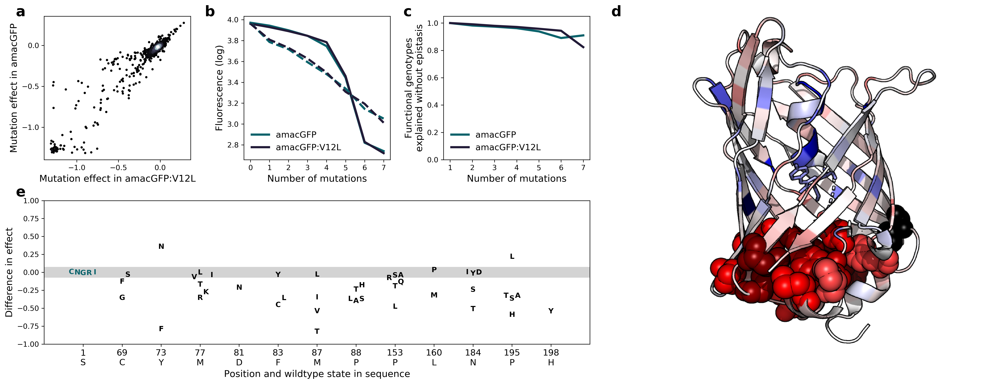

In [295]:
fig = plt.figure(figsize=[20,8], dpi=300)

make_figure_letters(fig, {'a':(-0.03,1), 'b':(0.17,1), 'c':(0.38,1), 'd':(0.6,1), 'e':(-0.03,0.45)}, 
                    fontsize=20)

cm = cmocean.cm.rain_r

# correlation between mutation effects
ax = fig.add_subplot(2,5,1)
density_plot(np.array(df_effects_singles['effect_in_amacV14L']), np.array(df_effects_singles['effect_in_amac']),
            s=10, cmap='bone')
plt.yticks([-1,-0.5,0])
label_plot_axis(x='Mutation effect in amacGFP:V12L', y='Mutation effect in amacGFP')

# mean and median brightnes vs number of mutations
ax = fig.add_subplot(2,5,2)
plt.plot(range(8), [data_aa[amacV14V_mask & (data_aa.n_mut==i)]['brightness'].median() for i in range(8)],
        color=cm(75), linewidth=3, label = 'amacGFP')
plt.plot(range(8), [data_aa[amacV14L_mask & (data_aa.n_mut==i)]['brightness'].median() for i in range(8)],
        color=cm(0), linewidth=3, label = 'amacGFP:V12L', )
plt.plot(range(8), [data_aa[amacV14V_mask & (data_aa.n_mut==i)]['brightness'].mean() for i in range(8)],
        color=cm(75), linewidth=3, linestyle='--')
plt.plot(range(8), [data_aa[amacV14L_mask & (data_aa.n_mut==i)]['brightness'].mean() for i in range(8)],
        color=cm(0), linewidth=3, linestyle='--',)
label_plot_axis(y='Fluorescence (log)',x='Number of mutations')
plt.legend(frameon=False, fontsize=12)
plt.xticks(range(8))
# legendary([c(100), c(0)], ['amacGFP', 'amacGFP:V12L'], loc='lower left', fontsize=12)

# observed vs expected bright genotypes
ax = fig.add_subplot(2,5,3)
cutoff = gate_borders_log['amac'][1] - ref_wt_log['amacGFP']
plt.plot([get_ratio_predicted2observed_fluo(data_aa[amac_mask], n_mut=i, 
                            threshold=cutoff) for i in range(1,8)],
                 color=cm(75),label='amacGFP', linewidth=3)
plt.plot([get_ratio_predicted2observed_fluo(data_aa[amacV14L_mask], n_mut=i, 
                            threshold=cutoff) for i in range(1,8)],
                 color=cm(0),label='amacGFP:V12L', linewidth=3)
plt.legend(frameon=False, fontsize=12)
label_plot_axis(x='Number of mutations', 
               y='Functional genotypes\nexplained without epistasis')
plt.ylim(0.,1.05)
plt.xticks(range(7),range(1,8))

# example of differences in mutation effect
ax = fig.add_subplot(2,5,(6,8))
positions = [1, 69, 73, 77, 81, 83, 87, 88, 153, 160, 184, 195, 198]
plt.fill_between([-1,17], [-0.07,-0.07], [0.07,0.07], color='lightgrey')
df_effects_singles['native_position_amac'] = df_effects_singles['position'].apply(lambda x:
                                                    pseudopos_to_nativepos[x][1])
df_effects_singles['effect_amacV14L_minus_amac'] = df_effects_singles['effect_in_amacV14L'] - df_effects_singles['effect_in_amac']
for j in range(len(positions)):
    yvals, labels = get_mutposeffect(df_effects_singles, y_column='effect_amacV14L_minus_amac', 
                                 x_column = 'native_position_amac', x_val=positions[j])
    xvals, yvals, labels = set_x_coordinates(yvals, labels, y_distance_threshold=0.15, 
                                         center_x=j, x_distance=0.15)
    for i in range(len(yvals)):
        plt.text(x = xvals[i] , y = yvals[i], s=labels[i], size='medium', color=cm(75) if j==0 else 'k',
               verticalalignment='center', horizontalalignment='center', weight='semibold')
plt.xlim(-1,len(positions))
plt.ylim(-1,1)
plt.xticks(range(len(positions)), [str(pos)+'\n'+amac_wt[pos] for pos in positions], fontsize=12)
label_plot_axis(x='Position and wildtype state in sequence', y='Difference in effect')

# pymol picture
ax = fig.add_subplot(2,5,(4,10))
show_image(os.path.join(figures_folder, 'other_images', 'amac_amacV14L_difference.png'))

plt.tight_layout(pad=2)

# plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_suppl_fig10.png'), dpi=300)

**A**, Correlation between effects of specific mutations in amacGFP backgrounds with and without the V14L mutation (Pearson's r = 0.96). **B**, Median (solid lines) and mean (dashed lines) fluorescence values of amacGFP:V14V and amacGFP:V14L genotypes with increasing numbers of mutations. **C**, Fraction of amacGFP:V14V and amacGFP:V14L genotypes observed to be fluorescent versus those expected to be fluorescent under the assumption of no epistasis. **D**, Median difference in effect of mutations in amacGFP:V14L, in reference to amacGFP, colored on the crystal structure of amacGFP. Position 14 is colored in black; red signifies that mutations at those positions tend to have worse effects in amacGFP:V14L than in amacGFP, while blue signifies the opposite. Atoms of positions with a median difference worse than -0.1 are represented by spheres. **D**, Differences in mutation effect between amacGFP:V14L and amacGFP, at the twelve most affected positions. For reference, the majority of mutations throughout the sequence have a difference in effect between -0.07 and 0.07 (shaded region, see position 1S).

# suppl. fig. 4

In [304]:
bcs = pd.read_csv(os.path.join(data_folder, 'final_datasets',
                              'avGFP_amacGFP_cgreGFP_ppluGFP2__wt_and_synonymous_barcodes.csv'))

In [318]:
def plot_wts_and_synmuts(gene, bc_data, xticks=[3,3.5,4,4.5], yticks=[100,500,1000], cellcount=50):
    ntwt = bc_data[(bc_data.nt_genotype.isnull()) & (bc_data.gene==gene)]
    aawt = bc_data[(bc_data.aa_genotype_native.isnull()) & (bc_data.nt_genotype.notnull()) & (bc_data.gene==gene)]
    
    if gene!= 'avGFP':
        ntwt = ntwt[ntwt.clone_cell_count > cellcount]
        aawt = aawt[aawt.clone_cell_count > cellcount]
        
    aabins = {'avGFP':10, 'amacGFP':10, 'cgreGFP':60, 'ppluGFP':20}
    
    sns.histplot(data = ntwt['log_brightness'],
                        bins=70, element='poly', color=colors[gene], fill=True, linewidth=0, 
                         label = f'Nucleotide WTs \n(n = {len(ntwt)})')
    
    sns.histplot(data = aawt['log_brightness'],
                    bins=aabins[gene], element='poly', color='k', fill=False, linewidth=2, linestyle='--', 
                     label=f'Synonymous mutants \n(n = {len(aawt)})', )
    
#     print(gene)
#     print('nt wt, ', ntwt['log_brightness'].mean(), ' +/- ', ntwt['log_brightness'].std())
#     print('aa wt, ', aawt['log_brightness'].mean(), ' +/- ', aawt['log_brightness'].std())
    
    plt.title(gene)
    plt.xlabel('Fluorescence (log)', fontsize=12)
    plt.ylabel('Number of barcodes', fontsize=12)
    plt.xticks(xticks,xticks)
    plt.yticks(yticks,yticks)
    
    p = scipy.stats.mannwhitneyu(ntwt['log_brightness'], aawt['log_brightness'], alternative='two-sided')
    plt.legend(loc='upper left', frameon=False, title=f'MWU, p = {round(p[1],2)}')

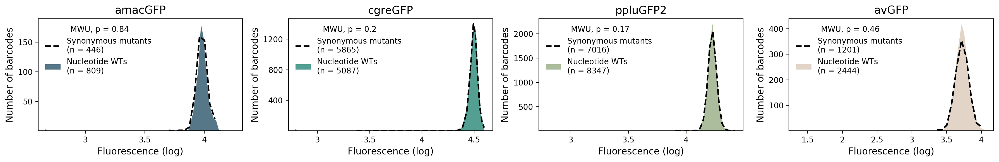

In [323]:
plt.figure(figsize=(18,3), dpi=200)
plt.axis('off')

yticks = {'amacGFP': [50,100,150], 'cgreGFP':[400,800,1200], 
          'ppluGFP':[500,1000,1500,2000], 'avGFP':[100,200,300,400]}
xticks = {'amacGFP': [3,3.5,4], 'cgreGFP':[3,3.5,4,4.5], 'ppluGFP':[3,3.5,4,4.5], 'avGFP':[1.5,2,2.5,3,3.5,4]}
xlims = {gene : (data_aa[(data_aa.gene==gene)]['brightness'].min() - 0.05, 
                 data_aa[(data_aa.gene==gene)]['brightness'].max() + 0.05)
                for gene in ['amacGFP','cgreGFP','ppluGFP','avGFP']}

# LIBRARY + CONTROL DISTRIBUTIONS
# for i,gene in zip([1,2,3,4], ['amacGFP','cgreGFP','ppluGFP','avGFP']):
#     ax = plt.subplot(4,4,i)
#     plot_library_distributions(gene, data, aadata, ax=ax,
#                               y1_label = 'Number of genotypes: Library' if gene=='amacGFP' else '',
#                               y2_label = 'Number of genotypes:\nWTs, chromophore mutants' if gene=='avGFP' else '')
#     plt.xlim(xlims[gene])
#     plt.xticks(xticks[gene],xticks[gene])    

        
# SYNONYMOUS VS NT WTS
for i,gene in zip([1,2,3,4], ['amacGFP','cgreGFP','ppluGFP','avGFP']):
    ax = plt.subplot(1,4,i)
    plot_wts_and_synmuts(gene, bcs, yticks=yticks[gene], xticks=xticks[gene])
#     if gene!='amacGFP':
#         plt.ylabel('')
    plt.xlim(xlims[gene])
    plt.title(names[gene], fontsize=14)
    
plt.tight_layout()
plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_suppl_fig3.png'), dpi=300)

# fig s. 6

#### DSF

In [351]:
dsf = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                              'dsf_data__av_amac_amacV14L_cgre_pplu.csv'))

In [343]:
dsf_tm_ratio = {}
for gene in set(dsf['gene']):
    t = list(dsf[(dsf.gene==gene)]['temperature'])
    r = list(dsf[(dsf.gene==gene)]['unfolding_ratio_deriv'])
    if gene == 'cgre' or gene == 'av':
        i = r.index(max(r))
        dsf_tm_ratio[gene] = t[i]
    else:
        i = r.index(min(r))
        dsf_tm_ratio[gene] = t[i]
        
dsf_tm_scatter = {}
for gene in set(dsf['gene']):
    t = list(dsf[(dsf.gene==gene)]['temperature'])
    r = list(dsf[(dsf.gene==gene)]['unfolding_scatter_deriv'])
    i = r.index(max(r))
    dsf_tm_scatter[gene] = t[i]

In [346]:
def plot_dsf(what='ratio', fontsize=12):
    assert what in ['ratio','scatter']
    ax = sns.lineplot(data = dsf, 
             x='temperature', y=f'unfolding_{what}_deriv', hue='gene', linewidth=2,
            ci='sd', palette = [colors[gene] for gene in ['pplu', 'amac', 'amacV14L', 'cgre', 'av']])
    
    for gene in ['av','pplu','amac','amacV14L','cgre']:
        plt.axvline(eval(f'dsf_tm_{what}')[gene], color=colors[gene], linestyle='--', linewidth=2)
        
    plt.xlabel('Temperature (C)', fontsize=fontsize)
    plt.xticks(range(20,111,10),range(20,111,10))
    ax.get_legend().remove()

#### DSC

In [375]:
dsc = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                              'dsc_data__av_amac_amacV14L_cgre_pplu.csv'))

In [356]:
def plot_dsc(fontsize=12):
    ax = sns.lineplot(data = dsc, 
             x='temperature', y='Cp_kJ/mol/K', ci=None, hue='gene', style='replicate', dashes=False,
            palette = [colors[gene] for gene in ['pplu','amac','V14L','cgre','av']], linewidth=2)
    
    for gene in ['av','amac','V14L','cgre','pplu']:
        plt.axvline(dsc_tm[gene], color=colors[gene], linestyle='--', linewidth=2)
    plt.xlabel('Temperature (C)', fontsize=fontsize)
    ax.get_legend().remove()

In [360]:
dsc_tm = {}
for gene in set(dsc['gene']):
    t1 = list(dsc[(dsc.gene==gene) & (dsc.replicate==0)]['temperature'])
    t2 = list(dsc[(dsc.gene==gene) & (dsc.replicate==1)]['temperature'])
    m1 =  list(dsc[(dsc.gene==gene) & (dsc.replicate==0)]['Cp_kJ/mol/K'])
    m2 = list(dsc[(dsc.gene==gene) & (dsc.replicate==1)]['Cp_kJ/mol/K'])
    if gene=='cgre132':
        tm = t1[m1.index(max(m1))]
    else:
        tm = (t1[m1.index(max(m1))] + t2[m2.index(max(m2))]) / 2
    dsc_tm[gene] = tm

#### qPCR

In [362]:
qpcr = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                              'qpcr_melting_curves.csv'))

In [363]:
qpcr_tm = {}
for gene in set(qpcr['gene']):
    t = list(qpcr[(qpcr.gene==gene)]['temperature'])
    m = list(qpcr[(qpcr.gene==gene)]['value'])
    tm = t[m.index(max(m))]
    qpcr_tm[gene] = tm

In [367]:
def plot_qpcr(what='melt', fontsize=12):
    ax = sns.lineplot(data = qpcr,
                      x='temperature', y='value', hue='gene', ci='sd',
                      palette=[colors[gene] for gene in ['amac','amacV14L','av','pplu','cgre']], linewidth=2)
    ax.get_legend().remove()
    plt.xlabel('Temperature (C)', fontsize=fontsize)
    for gene in ['av','amac','amacV14L','cgre',]:
        plt.axvline(qpcr_tm[gene], color=colors[gene], linewidth=2, linestyle='--')

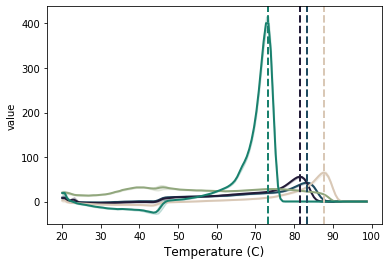

In [370]:
plot_qpcr()

#### CD

In [380]:
cd_spectra = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                              'cd_spectra_200to260.csv'))
cd_melt = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                              'cd_melting_curves.csv'))

In [382]:
cd_spectra['buffer'] = list(cd_spectra[cd_spectra.gene=='buffer']['value']) * 6
cd_spectra['value_normed'] = cd_spectra[['value','buffer']].apply(lambda x: x[0]-x[1], axis=1)

In [383]:
def plot_cd_spectra(gene, fontsize=12):
    sns.lineplot(data = cd_spectra[(cd_spectra.gene==gene) & ~((cd_spectra.nm<=205)&(cd_spectra.temp==98))], 
                 x='nm', y='value_normed', style='temp', color=colors[gene], linewidth=2)
    if gene=='av':
        plt.axvline(208, color='k', linestyle = ':', linewidth=2)
        plt.axvline(218, color='grey', linestyle=':', linewidth=2)
    else:
        plt.axvline(218, color='k', linestyle=':', linewidth=2)
    
    plt.xlabel('Wavelength (nm)', fontsize=fontsize)
    plt.ylabel('CD (mdeg)', fontsize=fontsize)
    legendary(['k','k'], ['30C', '98C'], edges=['-','--'], style='lines', title='Temperature', loc='upper right')

In [384]:
from scipy.optimize import curve_fit

def sigmoid(x, L ,x0, k, b):
    y = L / (1 + np.exp(-k*(x-x0)))+b
    return (y)

def cd_melt_fit(gene):
    nm = 208 if gene=='av' else 218
    xdata = cd_melt[(cd_melt.gene==gene) & (cd_melt.nm == nm)]['temperature']
    ydata = cd_melt[(cd_melt.gene==gene) & (cd_melt.nm == nm)]['value'] 
    guess = 80 if gene=='amac' else 75
    p0 = [max(ydata), guess, 1, min(ydata)]
    popt, pcov = curve_fit(sigmoid, xdata, ydata, p0)
    print(f'{gene}: L = {popt[0]}, x0 = {popt[1]}, k = {popt[2]}, b = {popt[3]}')
    return popt

In [385]:
def plot_cd_melting(gene, fontsize=12):
    nm = 208 if gene=='av' else 218
    xdata = cd_melt[(cd_melt.gene == gene) & (cd_melt.nm == nm)]['temperature']
    ydata = cd_melt[(cd_melt.gene == gene) & (cd_melt.nm == nm)]['value']
    
    if gene == 'av':
        plt.scatter(cd_melt[(cd_melt.gene == gene) & (cd_melt.nm == 218)]['temperature'],
                   cd_melt[(cd_melt.gene == gene) & (cd_melt.nm == 218)]['value'], 
                    color='lightgrey', s=3)
    
    plt.scatter(xdata, ydata, color=colors[gene], s=3, alpha=0.7)
    plt.xlabel('Temperature (C)', fontsize=fontsize)
    plt.ylabel('CD (mdeg)', fontsize=fontsize)
    
    x = np.linspace(30, 100, 100)
    popt = cd_melt_fit(gene)
    y = sigmoid(x, *popt)
    plt.plot(x,y, color='w', linewidth =6 )
    plt.plot(x,y, color='k', linewidth =2 )
    plt.axvline(popt[1], linewidth = 2, linestyle='--', color=colors[gene])

#### Plot

In [387]:
def legendary(colors, labels, edges=None, style='patches', **kwargs):
    if edges==None:
        edges = colors
    '''Possible kwargs: loc (location), ncol (for horizontal alignment fo labels)'''
    if style == 'patches':
        plt.legend(handles=[mpatches.Patch(facecolor=colors[i], edgecolor=edges[i]) for i in range(len(colors))], 
               labels=labels, frameon=False, **kwargs)
    elif style == 'lines':
        plt.legend(handles=[Line2D([0],[0],color=colors[i], linestyle=edges[i]) for i in range(len(colors))], 
               labels=labels, frameon=False, **kwargs)

amacV14L: L = 2.692551155667289, x0 = 80.38800006078053, k = 0.859351341629915, b = -3.1767309079670807
amac: L = 2.6140932241650328, x0 = 82.6303267048625, k = 0.7241312365215388, b = -3.337282815269062
cgre: L = 5.609848988918248, x0 = 71.24792360419332, k = 1.2684480435786951, b = -5.534120687527071
pplu: L = 1.9591876969557127, x0 = 86.38540787212203, k = 0.6297342164525306, b = -1.4568879092686993
av: L = -4.03077587259635, x0 = 83.72176080346874, k = 0.6685226611014845, b = -1.8771918640751692


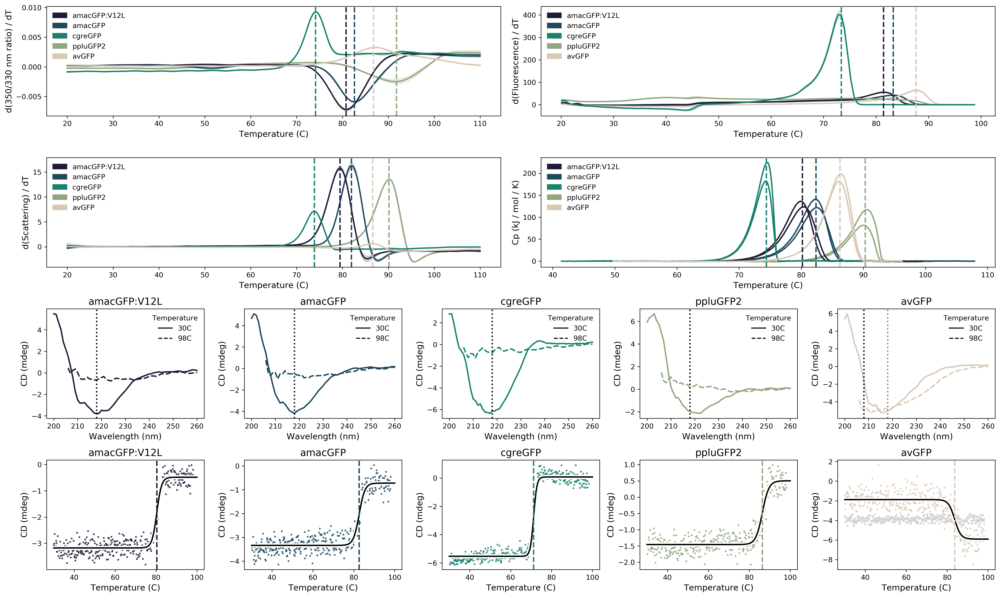

In [389]:
fig = plt.figure(figsize=[20,12], dpi=300)
plt.axis('off')

plt.subplot(4,10,(1,5))
label_plot_axis(y = 'd(350/330 nm ratio) / dT', fontsize_y=12)
plot_dsf('ratio')
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(6,10))
label_plot_axis(y = 'd(Fluorescence) / dT', fontsize_y=12)
plot_qpcr()
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(11,15))
label_plot_axis(y = 'd(Scattering) / dT', fontsize_y=12)
plot_dsf('scatter')
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(16,20))
label_plot_axis(y = 'Cp (kJ / mol / K)', fontsize_y=12)
plot_dsc()
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

for i,gene in zip([21,23,25,27,29], ['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(4,10,(i,i+1))
    plt.title(names[gene], fontsize=14)
    plot_cd_spectra(gene)
    plt.subplot(4,10,(i+10,i+11))
    plot_cd_melting(gene)
    plt.title(names[gene], fontsize=14)
    
plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_suppl_fig6.png'), dpi=300)

# secmals

In [391]:
sec = pd.read_csv(os.path.join(structure_folder, 'secmals',
                              'secmals_raw.csv'))
sec_peaks = pd.read_csv(os.path.join(structure_folder, 'secmals',
                              'secmals_peak_weights.csv'))

In [398]:
sec_bestrep = {'amac':1, 'av':2, 'pplu':1, 'V14L':2, 'cgre':2}

In [399]:
peak_num = {'V14L':{4:(9.53, 89193, 0.45), 3:(9.9, 76369,1.06), 2:(10.5, 55843,31.27), 1:(11.5,28909,67.22)},
           'amac': {4:(9.57,110977,0.68), 3:(9.9,87143,1.92), 2:(10.5, 56064,46.09), 1:(11.5,30114,51.31)},
           'cgre': {2:(9.5,106915,0.7), 1:(11,55082,99.3)},
           'pplu': {1:(11.5, 104228, 97.51), 2:(8.2, 1341321, 2.49)},
           'av':{1:(11.5, 30166, 99.08), 2:(10.26, 51169, 0.92)}}

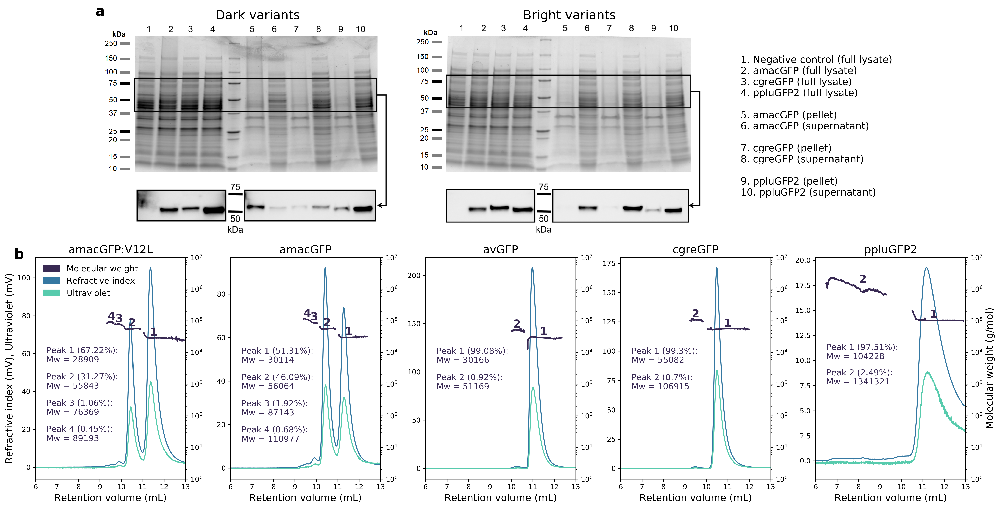

In [406]:
fig = plt.figure(figsize=[20,10], dpi=300)
plt.axis('off')

cm = sns.cm.mako

for i,gene in zip(range(6,11) ,['V14L','amac','av','cgre','pplu']):
    ax1 = fig.add_subplot(2,5,i)
    df = sec[(sec.gene==gene) & (sec.replicate==sec_bestrep[gene]) & (sec.retention_volume_mL<13)]
    plt.plot(df['retention_volume_mL'], df['refractive_index_mV'], color=cm(125), label='Refractive index')
    plt.plot(df['retention_volume_mL'], df['ultraviolet_mV'], color=cm(200), label='Ultraviolet')
#     plt.plot(df['retention_volume_mL'], df['right_angle_light_scatter_mV']-82)
    plt.xlim(6,13)
    plt.title(names[gene], fontsize=16)
    plt.xlabel('Retention volume (mL)', fontsize=14)
    
    if i==6:
        plt.ylabel('Refractive index (mV), Ultraviolet (mV)', fontsize=14)
        legendary([cm(50), cm(125), cm(200)], ['Molecular weight', 'Refractive index', 'Ultraviolet'],
                 loc='upper left', fontsize=12)
        plt.text(5, 110, 'b', fontsize=20, weight='semibold')
        
    y = ax1.get_ylim()
    j = 0
    for peak in sorted(peak_num[gene]):
        plt.text(6.5, y[1]/2 - j, 
                 f'Peak {peak} ({peak_num[gene][peak][2]}%):\nMw = {peak_num[gene][peak][1]}', color=cm(50),
                size=12)
        j += y[1]/8
        
#     elif i==2:
#         y = ax1.get_ylim()
#         plt.text(6.5, y[1]/2, 'Peak 1 (0.68%):\nMw = 110 977', )
    
    ax2 = ax1.twinx()
    df = sec_peaks[(sec_peaks.gene==gene) & (sec_peaks.replicate==sec_bestrep[gene])]
    plt.plot(df['retention_volume_mL'], df['molecular_weight_g/mol'], color=cm(50), linewidth=2,
            label = 'Molecular weight')

    plt.yscale('log')
    plt.ylim(1, 10000000)
#     plt.yticks([10**i for i in range(0,7)], [10**i for i in range(0,7)])
#     plt.yticks([28000, 54000, 82000, 110000],[28000, 54000, 82000, 110000])
    if i==10:
        plt.ylabel('Molecular weight (g/mol)', fontsize=14)    
    
        

    for peak in peak_num[gene]:
        plt.text(peak_num[gene][peak][0], peak_num[gene][peak][1], peak, color=cm(50), weight='semibold',
                horizontalalignment='center', verticalalignment='bottom', fontsize=16)
        
    # mol weight peaks!
plt.tight_layout()      

plt.subplot(2,5,(1,4))
show_image(os.path.join(figures_folder, 'other_images','WB_p10_p3.png'))

plt.subplot(2,5,5)
plt.axis('off')
plt.text(-4,1.0,'Dark variants',rotation=0,size=18,verticalalignment='center')
plt.text(-1.95,1.0,'Bright variants',rotation=0,size=18,verticalalignment='center')
plt.text(-4.8, 1, 'a', weight='semibold', fontsize=20)

endline = '\n' 
keys = {1:'Negative control (full lysate)', 2:'amacGFP (full lysate)', 3:'cgreGFP (full lysate)',
       4:'ppluGFP2 (full lysate)\n', 5:'amacGFP (pellet)', 6:'amacGFP (supernatant)\n', 7:'cgreGFP (pellet)',
       8:'cgreGFP (supernatant)\n', 9:'ppluGFP2 (pellet)', 10:'ppluGFP2 (supernatant)'}

plt.text(-0.5, 0.5, endline.join([f'{i}. {keys[i]}' for i in range(1,11)]),
        size=14, verticalalignment='center')
    
plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_suppl_fig8.png'), dpi=300)

# about predictions

In [25]:
import pickle

In [26]:
bgs = pickle.load(open(os.path.join(analysis_folder, 'notebooks', 
                                   'mutation_effects_by_background_log10.pkl'), 'rb'))

In [15]:
predictions

,full_seq,aa_genotype_native,aa_genotype_pseudo,gene,distance,non_extant_muts,katya_fitness,aubin_fitness,mutated_nt_coding,plate,sq_name,well,fiji_value,fiji_log_value,fiji_log_scaled,fiji_library_values
0,MSKGDELFTGIVPVLIELDGDVHGHKFSVRGEGEGDADYGKLEIKF...,E4D:E89Q:D128A:D179G:D189N:M232T,E7D:E93Q:D132A:D183G:D193N:M240T,amac,6.0,6.0,4.047982,4.071260,ATGAGCAAGGGCGATGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_3512,A1,48,1.681241,0.891257,3.827357
1,MSKGEELFTGIVPVLIELDGDVQGHKFSVRGEGEGDADYGKLEIKF...,H22Q:N148Y:G159A:L177F:Y181C:C226G,H25Q:N152Y:G163A:L181F:Y185C:C234G,amac,6.0,6.0,3.980428,4.153657,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_2908,B1,75,1.875061,1.051326,4.038406
2,MSKGEELFTGIVPVLIELDGDVHGHKFSVRGEGEGDADYGKLEIKF...,L140M:N148Y:K165Q:V185F:S201R:L235P,L144M:N152Y:K169Q:V189F:S208R:L243P,amac,6.0,6.0,4.091554,4.189361,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_3306,C1,75,1.875061,1.051326,4.038406
3,MSKGEELFTGIVPVLIELNGDVHGHKFSVRGEGEGDADYGKLEIKF...,D18N:D101A:D116A:A156P:Y181S:H230D,D21N:D105A:D120A:A160P:Y185S:H238D,amac,6.0,6.0,4.077757,4.123427,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_3873,D1,47,1.672098,0.883706,3.817401
4,MSKGEELFTGIVPVLIELNGNVHGHKFSVRGEGEGDADYGKLEIKC...,D18N:D20N:F45C:K51R:N134K:I166V,D21N:D23N:F48C:K54R:N138K:I170V,amac,6.0,5.0,4.305977,4.266685,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_930,E1,71,1.851258,1.031668,4.012487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,MTEPSVAAKLFEEEIPYITELEGDIDGKKFSIRGVGTGDAATGTIK...,A2E:L3P:T4S:E5V:G6A:K12E:V24I:E25D:M27K:I30S:K...,A2E:L3P:T4S:E5V:G6A:K12E:V24I:E25D:M27K:I30S:K...,cgre,48.0,12.0,7.048356,6.082765,ATGACTGAACCGTCCGTGGCGGCGAAGCTGTTCGAAGAGGAGATTC...,3,cgre48_1050,D9,48,1.681241,0.580551,3.772918
260,MTEPPGGAKLFDEEIPYITVLEGDVEGMKFTIRGVGTGNATTGTIK...,A2E:L3P:T4P:E5G:E11D:K12E:E19V:I30T:K32R:E34V:...,A2E:L3P:T4P:E5G:E11D:K12E:E19V:I30T:K32R:E34V:...,cgre,48.0,24.0,7.164687,5.943640,ATGACTGAACCGCCGGGCGGCGCGAAGCTGTTCGATGAGGAGATTC...,3,cgre48_1319,E9,4,0.602060,0.000000,2.770852
261,MIERPVGAMLFDKEIPYVTELEGDVEGKKFTIKGVGTGDATTGTIR...,T1I:A2E:L3R:T4P:E5V:K8M:E11D:I17V:M27K:I30T:E3...,T1I:A2E:L3R:T4P:E5V:K8M:E11D:I17V:M27K:I30T:E3...,cgre,48.0,24.0,7.231022,5.978107,ATGATAGAACGCCCGGTCGGCGCGATGCTGTTCGACAAAGAGATTC...,3,cgre48_1414,F9,183,2.262451,0.924062,4.365841
262,MAEPPEGAKLFDKEIPYVTELEGVVEGKKFTIKGVGTGNATTGTIR...,T1A:A2E:L3P:T4P:E11D:I17V:D23V:M27K:I30T:E34V:...,T1A:A2E:L3P:T4P:E11D:I17V:D23V:M27K:I30T:E34V:...,cgre,48.0,23.0,7.116255,5.887518,ATGGCCGAGCCACCCGAAGGCGCGAAGCTGTTCGATAAAGAGATTC...,3,cgre48_1770,G9,5,0.698970,0.000000,2.770852


# theoretical number of genotypes at each distance

In [79]:
from math import factorial

def product(iterable):
    prod = 1
    for n in iterable:
        prod *= n
    return prod

def npr(n, r):
    """
    Calculate the number of ordered permutations of r items taken from a
    population of size n.

    >>> npr(3, 2)
    6
    >>> npr(100, 20)
    1303995018204712451095685346159820800000
    """
    assert 0 <= r <= n
    return product(range(n - r + 1, n + 1))

def ncr(n, r):
    """
    Calculate the number of unordered combinations of r items taken from a
    population of size n.

    >>> ncr(3, 2)
    3
    >>> ncr(100, 20)
    535983370403809682970
    >>> ncr(100000, 1000) == ncr(100000, 99000)
    True
    """
    assert 0 <= r <= n
    if r > n // 2:
        r = n - r
    return npr(n, r) // factorial(r)

In [195]:
l = 235
n = 6
ncr(l,n) * (19**n)/50

2.0638899983798717e+17

In [183]:
10**21

1000000000000000000000

In [192]:
200 / (4*10**21)

5e-20

In [114]:
cgre_nt_wt = 'ATGACTGCACTTACCGAAGGCGCGAAGCTGTTCGAAAAAGAGATTCCCTATATCACCGAGCTGGAGGGCGACGTAGAGGGCATGAAGTTCATCATTAAGGGCGAGGGCACTGGCGATGCCACCACGGGCACCATCAAGGCGAAGTACATCTGCACCACCGGCGACCTGCCCGTGCCCTGGGCTACCATCCTGTCATCCCTGTCGTACGGCGTGTTTTGCTTCGCTAAATACCCCCGCCACATTGCGGACTTCTTCAAGTCCACCCAACCCGATGGCTACAGTCAGGACCGCATCATCTCGTTCGACAATGACGGCCAGTACGACGTGAAAGCCAAAGTGACGTATGAGAACGGTACACTATACAACCGCGTTACCGTGAAGGGCACTGGTTTCAAGTCAAACGGCAACATCCTGGGGATGCGCGTTTTGTACCACTCGCCACCCCACGCAGTCTATATCTTGCCTGACCGCAAGAATGGTGGCATGAAGATTGAGTATAACAAGGCCTTTGACGTAATGGGCGGCGGTCACCAGATGGCCCGTCACGCCCAGTTCAACAAGCCCCTTGGCGCATGGGAGGAAGATTACCCCCTGTACCACCACCTGACAGTGTGGACTAGCTTCGGCAAAGACCCCGATGACGACGAGACAGATCACCTTACGATCGTCGAGGTCATTAAGGCCGTAGACTTGGAAACGTACCGC'
amac_nt_wt = 'ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGATTGAGCTGGACGGCGACGTACACGGCCACAAGTTCAGCGTGCGCGGCGAGGGCGAGGGCGATGCCGACTACGGCAAGCTGGAGATCAAGTTCATCTGCACCACCGGCAAGCTGCCCGTGCCCTGGCCCACCCTCGTGACCACCCTGTCGTACGGCATTTTGTGCTTCGCGCGCTACCCCGAACACATGAAGATGAACGACTTCTTCAAGTCCGCCATGCCCGAAGGCTACATCCAGGAGCGCACCATCTTCTTCCAGGACGACGGCAAGTACAAGACCCGTGGGGAGGTGAAGTTCGAGGGCGACACACTGGTGAACCGCATCGAGCTGAAGGGCATGGACTTCAAGGAGGACGGCAACATCCTGGGGCACAAGCTGGAGTACAACTTTAACAGCCACAACGTCTATATCATGCCAGACAAGGCTAATAACGGCCTGAAGGTGAACTTCAAGATCCGCCACAACATCGAGGGCGGCGGGGTGCAGCTCGCCGACCACTACCAGACGAACGTTCCCTTGGGCGACGGCCCCGTGCTGATCCCCATCAACCACTACCTGAGCTGTCAGACAGCCATCAGCAAAGACCGTAACGAGACTCGCGATCACATGGTCTTTCTGGAGTTCTTTAGTGCCTGTGGGCATACTCACGGCATGGACGAGCTGTACAAG'
pplt_nt_wt = 'ATGCCAGCCATGAAAATCGAATGTCGCATTACGGGCACTCTGAACGGCGTGGAGTTCGAGCTCGTAGGCGGGGGCGAGGGCACCCCGGAACAGGGCCGCATGACCAACAAGATGAAGTCCACCAAAGGCGCACTGACCTTTTCTCCGTACCTGCTCAGCCACGTTATGGGTTACGGCTTCTATCACTTCGGCACGTACCCCTCCGGTTACGAGAATCCGTTCCTCCACGCTATCAACAACGGTGGCTACACAAATACGCGCATTGAAAAGTACGAGGACGGCGGCGTCCTTCACGTATCATTCTCATATCGTTATGAGGCGGGTCGCGTGATCGGCGACTTCAAGGTAGTGGGCACAGGCTTCCCTGAGGACTCAGTCATCTTTACGGACAAGATCATTCGTTCGAACGCAACCGTTGAGCATTTGCATCCAATGGGCGACAACGTGCTGGTAGGCTCGTTCGCTCGCACCTTTTCCCTGCGCGACGGCGGCTATTACTCATTTGTGGTAGACTCACACATGCACTTCAAAAGCGCGATCCACCCGAGTATTCTGCAGAATGGCGGTCCTATGTTTGCTTTTCGCCGCGTAGAAGAACTCCACAGCAACACTGAACTGGGGATCGTCGAGTATCAACACGCCTTCAAGACGCCCATTGCTTTCGCA'
av_nt_wt = 'ATGAGCAAGGGCGAGGAGCTGTTCACCGGGGTGGTGCCCATCCTGGTCGAGCTGGACGGCGACGTAAACGGCCACAAGTTCAGCGTGTCCGGCGAGGGCGAGGGCGATGCCACCTACGGCAAGCTGACCCTGAAGTTCATCTGCACCACCGGCAAGCTGCCCGTGCCCTGGCCCACCCTCGTGACCACCCTGTCGTACGGCGTGCAGTGCTTCAGCCGCTACCCCGACCACATGAAGCAGCACGACTTCTTCAAGTCCGCCATGCCCGAAGGCTACGTCCAGGAGCGCACCATCTTCTTCAAGGACGACGGCAACTACAAGACCCGCGCCGAGGTGAAGTTCGAGGGCGACACACTGGTGAACCGCATCGAGCTGAAGGGCATCGACTTCAAGGAGGACGGCAACATCCTGGGGCACAAGCTGGAGTACAACTACAACAGCCACAACGTCTATATCATGGCCGACAAGCAGAAGAACGGCATCAAGGTGAACTTCAAGATCCGCCACAACATCGAGGACGGCAGCGTGCAGCTCGCCGACCACTACCAGCAGAACACCCCCATCGGCGACGGCCCCGTGCTGCTGCCCGACAACCACTACCTGAGCACCCAGTCCGCCCTGAGCAAAGACCCCAACGAGAAGCGCGATCACATGGTCCTGCTGGAGTTCGTGACCGCCGCCGGGATCACTCACGGCATGGACGAGCTGTACAAG'

In [128]:
genetic_code = {'TTT': "F", 'TTC': "F", 'TTA': "L", 'TTG': "L", 'TCT': "S", 'TCC': "S", 'TCA': "S", 'TCG': "S",
                'TAT': "Y", 'TAC': "Y", 'TAA': "*", 'TAG': "*", 'TGT': "C", 'TGC': "C", 'TGA': "*", 'TGG': "W",
                'CTT': "L", 'CTC': "L", 'CTA': "L", 'CTG': "L", 'CCT': "P", 'CCC': "P", 'CCA': "P", 'CCG': "P",
                'CAT': "H", 'CAC': "H", 'CAA': "Q", 'CAG': "Q", 'CGT': "R", 'CGC': "R", 'CGA': "R", 'CGG': "R",
                'ATT': "I", 'ATC': "I", 'ATA': "I", 'ATG': "M", 'ACT': "T", 'ACC': "T", 'ACA': "T", 'ACG': "T",
                'AAT': "N", 'AAC': "N", 'AAA': "K", 'AAG': "K", 'AGT': "S", 'AGC': "S", 'AGA': "R", 'AGG': "R",
                'GTT': "V", 'GTC': "V", 'GTA': "V", 'GTG': "V", 'GCT': "A", 'GCC': "A", 'GCA': "A", 'GCG': "A",
                'GAT': "D", 'GAC': "D", 'GAA': "E", 'GAG': "E", 'GGT': "G", 'GGC': "G", 'GGA': "G", 'GGG': "G",
               
               'CTN':'L', 'GTN':'V', 'TCN':'S', 'CCN':'P', 'ACN':'T', 'GCN':'A', 'CGN':'R', 'GGN':'G'}

def translate(seq, genetic_code=genetic_code):
#     assert seq[0:3] == 'ATG'
    protein = ''
    for i in range(0, len(seq), 3):
        if i+3 > len(seq):
            break
        try:
            protein += genetic_code[seq[i:i+3]]
        except KeyError:
            protein = np.nan
            break
    return protein

def get_1nt_prots(seq):
    neighbors = []
    for i in range(len(seq)):
        neighbors.extend([seq[:i] + nt + seq[i+1:] for nt in 'ATCG' if nt!=seq[i]])
    neighbors = [translate(s) for s in neighbors]
    print(len(neighbors))
#     neighbors = set(neighbors)
    neighbors = set([n for n in neighbors if '*' not in n])
    return len(neighbors)

In [149]:
get_1nt_prots(pplt_nt_wt)

1998


1332

In [150]:
1163/1332

0.8731231231231231